In [2]:
import pandas as pd
import json
from sklearn.ensemble import IsolationForest
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np

In [3]:
project = "torvalds_linux"
# project = "apple_swift"
# project = "kubernetes_kubernetes"
# project = "vapor_vapor"

data_raw = pd.read_json(f"../output/{project}/commits.jsonl", lines=True)
with open(f"../output/{project}/repo_info.json", "r") as repo_stats_file:
    repo_stats: dict = json.load(repo_stats_file)

max_file_depth = repo_stats["max_file_depth"]
file_depth_cols = [f'nfiles_lvl{x}' for x in range(max_file_depth+1)]
split = pd.DataFrame(data_raw['total_files_per_level'].to_list(), columns = file_depth_cols)
data_raw = pd.concat([data_raw, split], axis=1) 

data_raw.head()

,commit_id,commit_time,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,...,nfiles_lvl4,nfiles_lvl5,nfiles_lvl6,nfiles_lvl7,nfiles_lvl8,nfiles_lvl9,nfiles_lvl10,nfiles_lvl11,nfiles_lvl12,nfiles_lvl13
0,1da177e4c3f41524e886b7f1b8a0c1fc7321cac2,2005-04-16 22:20:36,Linux-2.6.12-rc2\n\nInitial git repository bui...,17291,0,0,0,17291,"[6, 407, 7445, 7845, 1386, 202, 0, 0, 0, 0, 0,...",6,...,1386,202,0,0,0,0,0,0,0,0
1,5dfa9c1b4f5d399a2800d8486ca188988900db87,2005-04-16 22:24:40,[PATCH] mips: update VR41xx CPU-PCI bridge sup...,1,0,0,0,1,"[6, 407, 7445, 7846, 1386, 202, 0, 0, 0, 0, 0,...",6,...,1386,202,0,0,0,0,0,0,0,0
2,c97db4a0a7d4d5be8c64a8d649a4425ee195b05c,2005-04-16 22:24:48,[PATCH] i386 vDSO: add PT_NOTE segment\n\nThis...,1,0,0,0,1,"[6, 407, 7445, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,...,1386,202,0,0,0,0,0,0,0,0
3,1cfb7161cd0d0eb467f87e4afe29c94d693948c7,2005-04-16 22:25:56,[PATCH] Add dontdiff file\n\nAdd a current 'do...,1,0,0,0,1,"[6, 408, 7445, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,...,1386,202,0,0,0,0,0,0,0,0
4,c46f2ffb9e7fce7208c2639790e1ade42e00b146,2005-04-18 18:45:00,merge by hand (scsi_device.h)\n,0,1,0,0,1,"[6, 408, 7444, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,...,1386,202,0,0,0,0,0,0,0,0


In [4]:
# data_cols = [f'nfiles_lvl{x}' for x in range(14)]

data = data_raw.copy()#[data_cols]
data.set_index('commit_id', drop=True, inplace=True)
# data.set_index('commit_time', drop=True, inplace=True)

data.head()

,commit_time,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,...,nfiles_lvl4,nfiles_lvl5,nfiles_lvl6,nfiles_lvl7,nfiles_lvl8,nfiles_lvl9,nfiles_lvl10,nfiles_lvl11,nfiles_lvl12,nfiles_lvl13
commit_id,,,,,,,,,,,,,,,,,,,,,
1da177e4c3f41524e886b7f1b8a0c1fc7321cac2,2005-04-16 22:20:36,Linux-2.6.12-rc2\n\nInitial git repository bui...,17291,0,0,0,17291,"[6, 407, 7445, 7845, 1386, 202, 0, 0, 0, 0, 0,...",6,17291,...,1386,202,0,0,0,0,0,0,0,0
5dfa9c1b4f5d399a2800d8486ca188988900db87,2005-04-16 22:24:40,[PATCH] mips: update VR41xx CPU-PCI bridge sup...,1,0,0,0,1,"[6, 407, 7445, 7846, 1386, 202, 0, 0, 0, 0, 0,...",6,17292,...,1386,202,0,0,0,0,0,0,0,0
c97db4a0a7d4d5be8c64a8d649a4425ee195b05c,2005-04-16 22:24:48,[PATCH] i386 vDSO: add PT_NOTE segment\n\nThis...,1,0,0,0,1,"[6, 407, 7445, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,17293,...,1386,202,0,0,0,0,0,0,0,0
1cfb7161cd0d0eb467f87e4afe29c94d693948c7,2005-04-16 22:25:56,[PATCH] Add dontdiff file\n\nAdd a current 'do...,1,0,0,0,1,"[6, 408, 7445, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,17294,...,1386,202,0,0,0,0,0,0,0,0
c46f2ffb9e7fce7208c2639790e1ade42e00b146,2005-04-18 18:45:00,merge by hand (scsi_device.h)\n,0,1,0,0,1,"[6, 408, 7444, 7847, 1386, 202, 0, 0, 0, 0, 0,...",6,17293,...,1386,202,0,0,0,0,0,0,0,0


In [42]:
# set timestamp to index**
# data = data.groupby(data.index).sum()
# data

# resample timeseries to hourly **
# data = data.resample('W').sum()

# creature features from date**
# data['day'] = [i.day for i in data.index]
# data['day_name'] = [i.day_name() for i in data.index]
# data['day_of_year'] = [i.dayofyear for i in data.index]
# data['week_of_year'] = [i.weekofyear for i in data.index]
# data['hour'] = [i.hour for i in data.index]
# data['is_weekday'] = [i.isoweekday() for i in data.index]

In [43]:
#import matplotlib.pyplot as plt

# Assuming df is your DataFrame
#for column in feat_cols:
#    plt.figure()
#    data[column].hist(bins=50)  # You can adjust the number of bins as needed
#    plt.title(f'Histogram of {column}')
#    plt.xlabel(column)
#    plt.ylabel('Frequency')
#    plt.show()

# File mutations separately

In [5]:
feat_cols = []
feat_cols.append('n_added')
feat_cols.append('n_deleted')
feat_cols.append('n_moved')
feat_cols.append('n_renamed')
# data_cols.append('nfiles')
# feat_cols.append('commit_time')
# data_cols.append('commit_id')

In [6]:

# Assuming data is your DataFrame
if 'anomaly' in data.columns:
    data = data.drop('anomaly', axis=1)

isolation_forest = IsolationForest(contamination='auto', random_state=42)
isolation_forest.fit(data[feat_cols])

data['anomaly_score'] = isolation_forest.score_samples(data[feat_cols])
outliers = data[data['anomaly_score'] <= -0.7]

print(f'{len(outliers)} outliers:')
outliers[['message','n_added','n_deleted','n_moved','n_renamed', 'anomaly_score']]

150 outliers:


,message,n_added,n_deleted,n_moved,n_renamed,anomaly_score
commit_id,,,,,,
8b0ee07e108b2eefdab5bb73f33223f18926c3b2,Merge upstream (approx. 2.6.12-git8) into 'jan...,434,61,3,4,-0.762895
2868bd281fef21d1e73d6b7648a41efc3d75f10c,Merge /scratch/Ksrc/linux-git/\n,219,3,0,3,-0.703087
c2cc87ca9561ddfe744d446789cc10f507e87db9,Merge branch 'master'\n,163,105,205,1,-0.802607
25da0974601fc8096461f3d3f7ca3aab8e79adfb,Auto-update from upstream\n,192,11,10,4,-0.723746
c4366889dda8110247be59ca41fddb82951a8c26,Merge ../linus\n\nConflicts:\n\n\tdrivers/cpuf...,471,134,31,16,-0.834729
...,...,...,...,...,...,...
4b8c673b761e74add4fd185d806ac16c9b40158f,Merge tag 'media/v6.3-1' of git://git.kernel.o...,18,61,92,0,-0.740878
6e98b09da931a00bf4e0477d0fa52748bf28fcce,Merge tag 'net-next-6.4' of git://git.kernel.o...,225,84,9,0,-0.763565
6c1561fb900524c5bceb924071b3e9b8a67ff3da,Merge tag 'soc-dt-6.5' of git://git.kernel.org...,1247,1101,1485,0,-0.858208


In [46]:
# outliers.loc["f5a8eb632b562bd9c16c389f5db3a5260fba4157"]

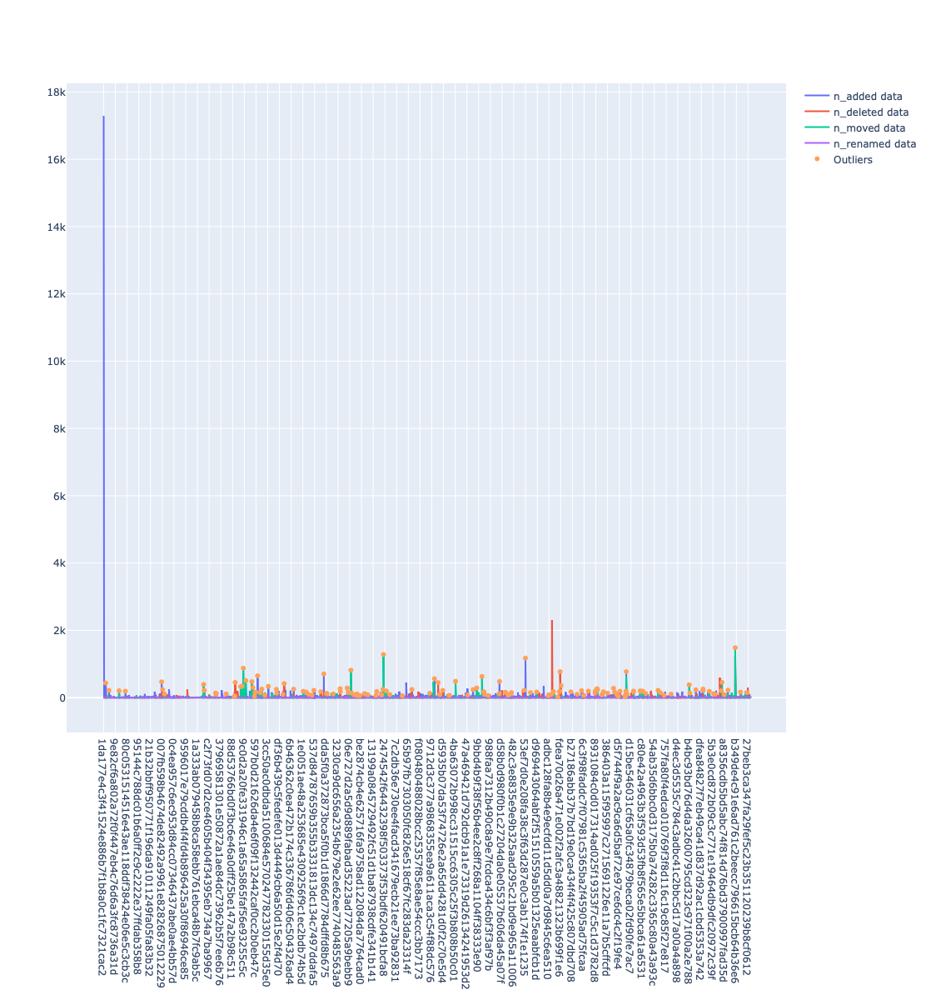

In [7]:
# Create a Plotly figure
fig = go.Figure()

# Add a line to the figure for each feature
for col in feat_cols:
    fig.add_trace(go.Scatter(x=data.index, y=data[col], mode='lines', name=f'{col} data'))

# Find the highest y-value among all features for each x where outliers is True
outlier_y = outliers[feat_cols].max(axis=1)

# Plot the outliers
fig.add_trace(go.Scatter(x=outliers.index, y=outlier_y, mode='markers', name='Outliers', text=outliers["message"].str.replace('\n', '<br>').str.slice(0,1000)))
fig.update_layout( autosize=False,height=1200, ) 

fig.show()

In [8]:
# Assuming data is your DataFrame
if 'anomaly' in data.columns:
    data = data.drop('anomaly', axis=1)

data["n_struc_changes"] = data[feat_cols].sum(axis=1)

isolation_forest = IsolationForest(contamination='auto', random_state=42)
isolation_forest.fit(data[["n_struc_changes"]])

data['anomaly_score'] = isolation_forest.score_samples(data[["n_struc_changes"]])
outliers = data[data['anomaly_score'] <= -0.8]

print(f'{len(outliers)} outliers:')
outliers[['message','n_added','n_deleted','n_moved','n_renamed', 'n_struc_changes', 'anomaly_score']]

65 outliers:


,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,anomaly_score
commit_id,,,,,,,
1da177e4c3f41524e886b7f1b8a0c1fc7321cac2,Linux-2.6.12-rc2\n\nInitial git repository bui...,17291,0,0,0,17291,-0.867549
8b0ee07e108b2eefdab5bb73f33223f18926c3b2,Merge upstream (approx. 2.6.12-git8) into 'jan...,434,61,3,4,502,-0.837557
c2cc87ca9561ddfe744d446789cc10f507e87db9,Merge branch 'master'\n,163,105,205,1,474,-0.838124
c4366889dda8110247be59ca41fddb82951a8c26,Merge ../linus\n\nConflicts:\n\n\tdrivers/cpuf...,471,134,31,16,652,-0.847246
d9bc125caf592b7d081021f32ce5b717efdf70c8,Merge branch 'master' of /home/trondmy/kernel/...,238,57,9,0,304,-0.804237
...,...,...,...,...,...,...,...
ff0c7e18629b8bd64681313a88ce55e182c9fee6,Merge tag 'arm-boardfile-remove-6.3' of git://...,0,593,0,0,593,-0.846101
a5c95ca18a98d742d0a4a04063c32556b5b66378,Merge tag 'drm-next-2023-02-23' of git://anong...,129,50,454,2,635,-0.847246
6e98b09da931a00bf4e0477d0fa52748bf28fcce,Merge tag 'net-next-6.4' of git://git.kernel.o...,225,84,9,0,318,-0.811342


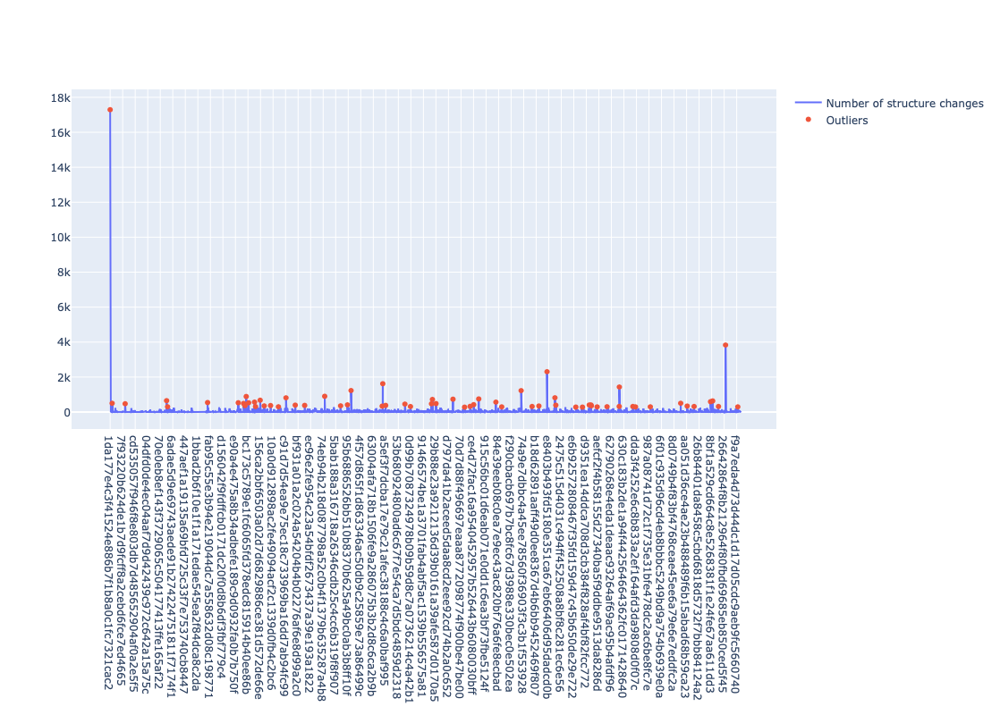

In [9]:
# Create a Plotly figure
fig = go.Figure()

# Add a line to the figure for each feature
fig.add_trace(go.Scatter(x=data.index, y=data["n_struc_changes"], mode='lines', name=f'Number of structure changes'))

# Find the highest y-value among all features for each x where outliers is True
outlier_y = outliers["n_struc_changes"]

# Plot the outliers
fig.add_trace(go.Scatter(x=outliers.index, y=outlier_y, mode='markers', name='Outliers', text=outliers["message"].str.replace('\n', '<br>').str.slice(0,1000)))
fig.update_layout( autosize=False,height=800, width=1280) 

fig.show()
fig.update_layout(height=800, width=1024)  # Set the width to 800 pixels
fig.write_image("outliers.pdf")

# File depths

In [50]:
depth_data = data[file_depth_cols]

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

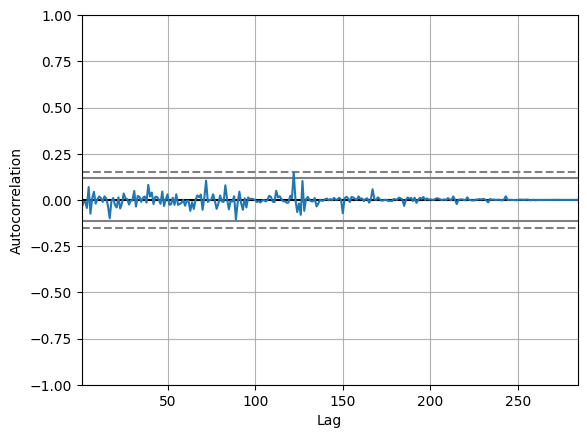

In [51]:
# From this we can derive that there appears to be no seasonality in the data, however there is a trend 
# (upwards due to the nature of software development, systems grow in size over time)
# All points are below 0.1 and there is no even spacing between the peaks and valleys in the graph
# This points to no seasonality

from pandas.plotting import autocorrelation_plot
differenced_df = depth_data.diff().fillna(0)
autocorrelation_plot(differenced_df[file_depth_cols])


In [52]:
# Assuming data is your DataFrame
if 'depth_anomaly_score' in data.columns:
    data = data.drop('depth_anomaly_score', axis=1)
    
# Detrend -> Software systems grow over time
differenced_df = depth_data.diff().fillna(0)

isolation_forest = IsolationForest(contamination='auto', random_state=42)
isolation_forest.fit(differenced_df)

data['depth_anomaly_score']= isolation_forest.score_samples(differenced_df)
outliers = data[data['depth_anomaly_score'] <= -0.60]

print(f'{len(outliers)} outliers:')
outliers

8 outliers:


,commit_time,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,nfiles_lvl0,nfiles_lvl1,nfiles_lvl2,nfiles_lvl3,nfiles_lvl4,anomaly_score,depth_anomaly_score
commit_id,,,,,,,,,,,,,,,,,
755a31c6e28fcc5562d0796d46c59a68baea061e,2016-02-25 21:19:22,Merge pull request #73 from qutheory/hd/travis...,13,1,41,0,55,"[6, 3, 12, 36, 5]",5,62,6,3,12,36,5,-0.617893,-0.777729
20346530f26d07f812fa51de9edc01c52b90edc4,2016-03-28 04:02:52,Merge pull request #156 from qutheory/sh/app-r...,11,76,1,1,89,"[7, 3, 18, 61, 3]",5,92,7,3,18,61,3,-0.747061,-0.680247
531fc06d3fcc09dd4ca2f67c44a63397e57ad7d0,2016-07-12 22:23:54,Merge pull request #436 from qutheory/engine-i...,3,80,0,0,83,"[17, 1, 35, 98, 17]",5,168,17,1,35,98,17,-0.726131,-0.703904
64801c5d905696ec7f83ce0a565f4781b84718a5,2016-07-13 03:20:14,Merge pull request #450 from qutheory/droplet-...,1,3,4,0,8,"[10, 6, 35, 98, 17]",5,166,10,6,35,98,17,-0.491557,-0.690658
5454facd0fbd19fd3794c5f6ecf73c6883bce8cc,2017-02-24 09:00:58,Merge remote-tracking branch 'upstream/master'\n,8,45,0,0,53,"[14, 6, 71, 92, 22]",5,205,14,6,71,92,22,-0.618730,-0.602872
bcc324449ed828ab55cf4bb0b662ccc1e7206165,2018-02-23 07:23:25,Merge pull request #1111 from vapor/beta\n\nva...,69,190,5,0,264,"[5, 6, 13, 66, 5]",5,95,5,6,13,66,5,-0.886537,-0.772119
af2b50e7e37de2edaf3285924678c415a35d2ac3,2019-04-10 16:13:29,add multipart + url-encoded content; cleanup o...,90,25,7,2,124,"[5, 9, 27, 126, 17]",5,184,5,9,27,126,17,-0.815746,-0.632334
633b2a81f547383aa6becb6ba1ad011dc7174779,2020-04-09 17:39:40,4.0.0 gm (#2278)\n\n* gm\r\n\r\n* update Authe...,32,10,27,1,70,"[4, 6, 48, 152, 34]",5,244,4,6,48,152,34,-0.710221,-0.681701


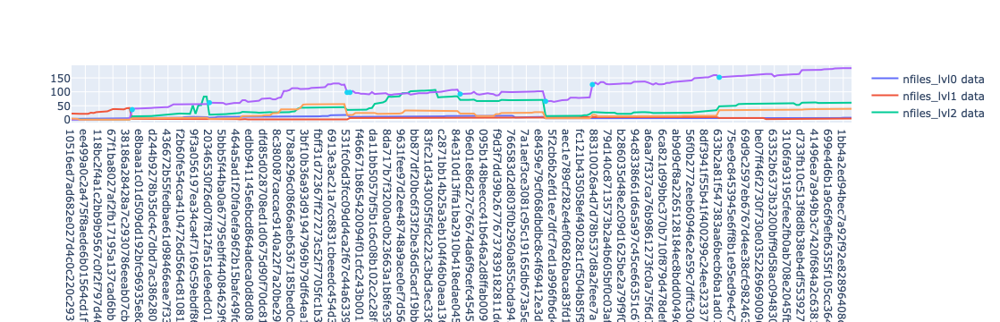

In [53]:
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np

# Create a Plotly figure
fig = go.Figure()

# Add a line to the figure for each feature
for col in file_depth_cols:
    fig.add_trace(go.Scatter(x=data.index, y=data[col], mode='lines', name=f'{col} data'))

# Find the highest y-value among all features for each x where outliers is True
outlier_y = outliers[file_depth_cols].max(axis=1)

# Plot the outliers
fig.add_trace(go.Scatter(x=outliers.index, y=outlier_y, mode='markers', name='Outliers', text=outliers["message"].str.replace('\n', '<br>')))
# Plot the outliers as vertical lines
# for idx, row in outliers.iterrows():
#     fig.add_shape(
#         type='line',
#         x0=idx,
#         x1=idx,
#         y0=0,
#         y1=row[file_depth_cols].max(),
#         line=dict(color='red', width=2, dash='dash'),
#         # text=row["message"].replace('\n', '<br>')
#     )

fig.show()

# Total number of files

In [54]:
# Assuming data is your DataFrame
if 'nfiles_anomaly' in data.columns:
    data = data.drop('nfiles_anomaly', axis=1)
    
# Detrend -> Software systems grow over time
nr_files = data[["total_files"]]
differenced_nr_files_df = nr_files.diff().fillna(0)

isolation_forest = IsolationForest(contamination='auto', random_state=42)
isolation_forest.fit(differenced_nr_files_df)

data['nfiles_anomaly_score'] = isolation_forest.score_samples(differenced_nr_files_df)
nfiles_outliers = data[data['nfiles_anomaly_score'] <= -0.8]

print(f'{len(nfiles_outliers)} nfiles_outliers:')
nfiles_outliers

2 nfiles_outliers:


,commit_time,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,nfiles_lvl0,nfiles_lvl1,nfiles_lvl2,nfiles_lvl3,nfiles_lvl4,anomaly_score,depth_anomaly_score,nfiles_anomaly_score
commit_id,,,,,,,,,,,,,,,,,,
bcc324449ed828ab55cf4bb0b662ccc1e7206165,2018-02-23 07:23:25,Merge pull request #1111 from vapor/beta\n\nva...,69,190,5,0,264,"[5, 6, 13, 66, 5]",5,95,5,6,13,66,5,-0.886537,-0.772119,-0.858789
af2b50e7e37de2edaf3285924678c415a35d2ac3,2019-04-10 16:13:29,add multipart + url-encoded content; cleanup o...,90,25,7,2,124,"[5, 9, 27, 126, 17]",5,184,5,9,27,126,17,-0.815746,-0.632334,-0.824625


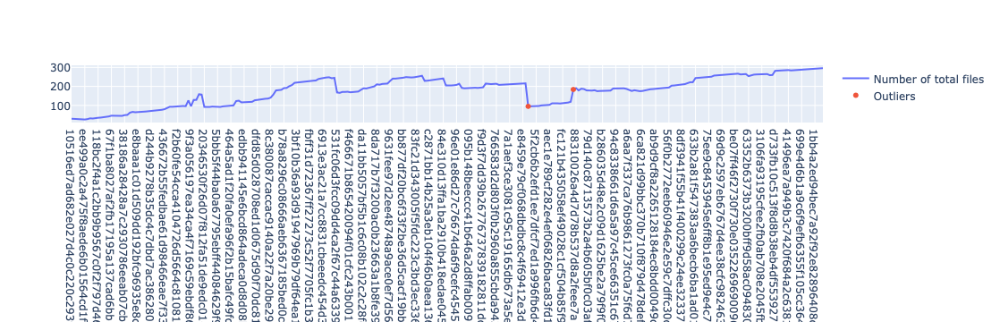

In [55]:
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np

# Create a Plotly figure
fig = go.Figure()

# Add a line to the figure for each feature
fig.add_trace(go.Scatter(x=data.index, y=data["total_files"], mode='lines', name=f'Number of total files'))

# Plot the outliers
fig.add_trace(go.Scatter(x=nfiles_outliers.index, y=nfiles_outliers["total_files"], mode='markers', name='Outliers', text=nfiles_outliers["message"].str.replace('\n', '<br>')))

fig.show()

# Outcome
I believe from this exploration the best would be to take a look at the number of total structural changes and use this to determine the outliers. This encapsulates the total number of files (as many files added would show an increase in total number of files as well as many structural changes)

In [56]:
##### # Detrend -> Software systems grow over time
nr_files = data[["max_file_depth"]]
differenced_nr_files_df = nr_files.diff().fillna(0)

isolation_forest = IsolationForest(contamination=0.001, random_state=42)
isolation_forest.fit(differenced_nr_files_df)

data['nfiles_anomaly_score'] = isolation_forest.score_samples(differenced_nr_files_df)
nfiles_outliers = data[data['nfiles_anomaly_score'] <= -0.5]

print(f'{len(nfiles_outliers)} nfiles_outliers:')
nfiles_outliers

2 nfiles_outliers:


,commit_time,message,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,nfiles_lvl0,nfiles_lvl1,nfiles_lvl2,nfiles_lvl3,nfiles_lvl4,anomaly_score,depth_anomaly_score,nfiles_anomaly_score
commit_id,,,,,,,,,,,,,,,,,,
ce6628d0305e4a46d6b820edca73a6ed05de7b52,2016-02-03 23:32:26,share schemes\n,2,0,0,0,2,"[4, 21, 1, 2, 0]",4,28,4,21,1,2,0,-0.410296,-0.301315,-0.87744
755a31c6e28fcc5562d0796d46c59a68baea061e,2016-02-25 21:19:22,Merge pull request #73 from qutheory/hd/travis...,13,1,41,0,55,"[6, 3, 12, 36, 5]",5,62,6,3,12,36,5,-0.617893,-0.777729,-0.87744


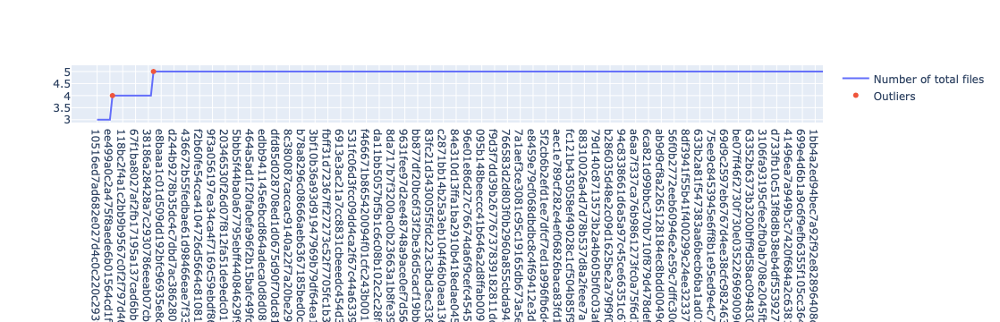

In [57]:
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np

# Create a Plotly figure
fig = go.Figure()

# Add a line to the figure for each feature
fig.add_trace(go.Scatter(x=data.index, y=data["max_file_depth"], mode='lines', name=f'Number of total files'))

# Plot the outliers
fig.add_trace(go.Scatter(x=nfiles_outliers.index, y=nfiles_outliers["max_file_depth"], mode='markers', name='Outliers', text=nfiles_outliers["message"].str.replace('\n', '<br>')))

fig.show()